In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Loading Images

In [ ]:
import os
import cv2
import numpy as np
import skimage
from skimage import filters
from PIL import Image, ImageOps

In [ ]:
def load_img(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder,filename))
        #img = np.array(Image.open(os.path.join(folder,filename)))
        if img is not None:
            images.append(img)
        #print(filename)
    return images

In [ ]:
gaussian_blur_images = load_img('/content/drive/MyDrive/stage1_data/gaussian_blur')

In [ ]:
input_images = load_img('/content/drive/MyDrive/stage1_data/input_imgs')

In [ ]:
#input_images = load_img('/content/drive/MyDrive/stage1_data/input_imgs')

In [ ]:
motion_blur = load_img('/content/drive/MyDrive/stage1_data/motion_blur')

In [ ]:
sp_noise = load_img('/content/drive/MyDrive/stage1_data/sp_noise')

In [ ]:
gaussian_noise_images = load_img('/content/drive/MyDrive/stage1_data/gaussian_noise')

In [ ]:
speckle_noise_images = load_img('/content/drive/MyDrive/stage1_data/speckle_noise')

In [ ]:
input_images[0].shape

(512, 1392, 3)

In [51]:
from google.colab.patches import cv2_imshow

# Image Filters

In [ ]:
from scipy.signal import gaussian, convolve2d

# Define the size and standard deviation of the first PSF
psf_size_1 = 31
psf_std_1 = 3

# Define the size and standard deviation of the second PSF
psf_size_2 = 15
psf_std_2 = 1.5

# Generate a 1D Gaussian kernel along each axis for the first PSF
x = np.linspace(-psf_size_1 // 2, psf_size_1 // 2, psf_size_1)
psf_1d_1 = gaussian(psf_size_1, psf_std_1)
psf_2d_1 = np.outer(psf_1d_1, psf_1d_1)

# Normalize the first PSF so that it sums to 1
psf_2d_1 /= np.sum(psf_2d_1)

# Generate a 1D Gaussian kernel along each axis for the second PSF
x = np.linspace(-psf_size_2 // 2, psf_size_2 // 2, psf_size_2)
psf_1d_2 = gaussian(psf_size_2, psf_std_2)
psf_2d_2 = np.outer(psf_1d_2, psf_1d_2)

# Normalize the second PSF so that it sums to 1
psf_2d_2 /= np.sum(psf_2d_2)

In [ ]:
psf_size_2 = np.arange(3,20,2, dtype=int)
psf_std_2 = np.linspace(.1,4,10)
psf_arr = []
psf_std_arr = []
for i in psf_size_2:
  for j in psf_std_2:
    x = np.linspace(-i // 2, i // 2, i)
    psf_1d_2 = gaussian(i, j)
    psf_2d_2 = np.outer(psf_1d_2, psf_1d_2)
    psf_2d_2 /= np.sum(psf_2d_2)
    psf_arr.append(psf_2d_2)
    psf_std_arr.append(psf_std_arr)


# Normalize the second PSF so that it sums to 1
#psf_2d_2 /= np.sum(psf_2d_2)

In [ ]:
psf_arr[0]

array([[3.72007598e-44, 1.92874985e-22, 3.72007598e-44],
       [1.92874985e-22, 1.00000000e+00, 1.92874985e-22],
       [3.72007598e-44, 1.92874985e-22, 3.72007598e-44]])

## Removing Salt and Pepper Noise (also use for speckle)

In [ ]:
#salt and pepper removal filter / speckle noise removal filter
def remove_SP_noise(image, kernel = 3):
  red_channel = image[:,:,0]
  green_channel = image[:,:,1]
  blue_channel = image[:,:,2]
  sharpen_r = filters.median(red_channel,selem = np.ones((kernel,kernel)))
  sharpen_g = filters.median(green_channel,selem = np.ones((kernel,kernel)))
  sharpen_b = filters.median(blue_channel,selem = np.ones((kernel,kernel)))
  sharpen_speck = np.stack([sharpen_r,sharpen_g,sharpen_b], axis = -1)
  return sharpen_speck

## Removing Gaussian Noise

In [ ]:
from skimage.filters import unsharp_mask
def remove_gaussian_noise(img,k_size):
  img = cv2.GaussianBlur(img, (k_size, k_size), sigmaX = 0)
  img = img/255
  psf = np.ones((k_size, k_size)) / k_size**2
  rad = 5
  bal = .08
  r = unsharp_mask(img[:,:,0],radius = rad )
  g = unsharp_mask(img[:,:,1],radius = rad )
  b = unsharp_mask(img[:,:,2],radius = rad )
  out_r = skimage.restoration.wiener(r,psf = psf, balance = bal)
  out_g = skimage.restoration.wiener(g,psf = psf, balance = bal)
  out_b = skimage.restoration.wiener(b,psf = psf, balance = bal)
  filtered_img = np.stack([out_r, out_g, out_b], axis = -1)
  return filtered_img


In [ ]:
def rgn2(image, k=5, sigma_x=0):
    # Load the image
    kernel_size=(k, k)


    # Apply Gaussian blur to remove noise
    denoised_image = cv2.GaussianBlur(image, kernel_size, sigma_x)

    return denoised_image

## Gaussian Blur


In [ ]:
def bilat(img, d=5, sigma_color=75, sigma_space=75, alpha=1.0, beta=0.0):
    # Apply bilateral filter to each color channel
    filtered_r = cv2.bilateralFilter(img[:,:,0], d, sigma_color, sigma_space)
    filtered_g = cv2.bilateralFilter(img[:,:,1], d, sigma_color, sigma_space)
    filtered_b = cv2.bilateralFilter(img[:,:,2], d, sigma_color, sigma_space)

    # Combine filtered channels back into a single color image
    filtered_img = np.dstack((filtered_r, filtered_g, filtered_b))

    # Compute Laplacian of filtered image to sharpen it
    laplacian = cv2.Laplacian(filtered_img, cv2.CV_64F)

    # Scale the Laplacian values to [0, 255] and convert to uint8
    sharpened = np.uint8(np.clip(alpha * laplacian + beta, 0, 255))

    return filtered_img

In [ ]:
skimage.restoration.unsupervised_wiener

<function skimage.restoration.deconvolution.unsupervised_wiener(image, psf, reg=None, user_params=None, is_real=True, clip=True, *, random_state=None)>

In [ ]:
from skimage.filters import unsharp_mask
def remove_gaussian_blur(img,k_size):
  psf = np.ones((k_size, k_size)) / k_size**2
  #r = img[:,:,0]
  #g = img[:,:,1]
  #b = img[:,:,2]
  rad = 5
  bal = .08
  r = unsharp_mask(img[:,:,0],radius = rad )
  g = unsharp_mask(img[:,:,1],radius = rad )
  b = unsharp_mask(img[:,:,2],radius = rad )
  out_r = skimage.restoration.wiener(r,psf = psf, balance = bal)
  out_g = skimage.restoration.wiener(g,psf = psf, balance = bal)
  out_b = skimage.restoration.wiener(b,psf = psf, balance = bal)
  filtered_img = np.stack([out_r, out_g, out_b], axis = -1)
  return filtered_img


In [ ]:
from skimage.metrics import peak_signal_noise_ratio
img = (gaussian_blur_images[2])/255
for i in range(2,10):
  psf = np.ones((i, i)) / i**2
  print(i)
  r = skimage.restoration.wiener(img[:,:,0],psf = psf, balance = .5)
  g = skimage.restoration.wiener(img[:,:,1],psf = psf, balance = .5)
  b = skimage.restoration.wiener(img[:,:,2],psf = psf, balance = .5)
  filtered_img = np.stack([r, g, b], axis = -1)
  psnr = peak_signal_noise_ratio(input_images[0]/255, filtered_img)
  struct =  skimage.metrics.structural_similarity(input_images[0]/255,filtered_img,multichannel=True)
  #psnr = peak_signal_noise_ratio(filtered_img, input_images[0])
  print(psnr)
  print(struct)

2


<ipython-input-24-60619e8691ae>:11: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  struct =  skimage.metrics.structural_similarity(input_images[0]/255,filtered_img,multichannel=True)


15.257792854060849
0.5769779389005247
3
15.268353591709632
0.5769683564725309
4
15.223263337669861
0.5739615143446336
5
15.212757036114377
0.57134352436548
6
15.145100207901837
0.5649112500868867
7
15.098743722053182
0.557870543464142
8
14.986806089036403
0.5456171931258802
9
14.878467772775185
0.531725824176558


In [ ]:
peak_signal_noise_ratio(input_images[0]/255, img)

15.29278056244406

In [ ]:
psnr = peak_signal_noise_ratio(input_images[0], filtered_img)

<ipython-input-26-dd1791300c0a>:1: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr = peak_signal_noise_ratio(input_images[0], filtered_img)


In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio

def restore_image_with_best_snr(img, psf, noise_std, alpha_range=(0.5, 2.0), beta_range=(0.0, 0.5),
                                sigma_color_range=(50, 200), sigma_space_range=(50, 200), d_range=(5, 15)):
  """
  Restores the input image using the Wiener deconvolution with the best bilateral filter parameters that maximize the
  peak signal-to-noise ratio (PSNR) between the restored and original image.

  Parameters:
      img (numpy.ndarray): Input image.
      psf (numpy.ndarray): Point spread function (PSF) of the blur kernel.
      noise_std (float): Standard deviation of the Gaussian noise.
      alpha_range (tuple): Range of values for the alpha parameter of the bilateral filter.
      beta_range (tuple): Range of values for the beta parameter of the bilateral filter.
      sigma_color_range (tuple): Range of value  s for the sigma_color parameter of the bilateral filter.
      sigma_space_range (tuple): Range of values for the sigma_space parameter of the bilateral filter.
      d_range (tuple): Range of values for the d parameter of the bilateral filter.

  Returns:
      numpy.ndarray: Restored image with the best PSNR.
  """
  # Generate noisy blurred image
  #blurred = cv2.GaussianBlur(img, (3, 3), 0)
  #blurred_noisy = blurred + noise_std * np.random.randn(*blurred.shape)

  # Initialize best PSNR and best parameters
  best_psnr = -np.inf
  best_params = None

  # Perform grid search over parameter ranges
  #for alpha in np.linspace(*alpha_range, num=5):
      #for beta in np.linspace(*beta_range, num=5):
  for sigma_color in np.linspace(*sigma_color_range, num=5):
      for sigma_space in np.linspace(*sigma_space_range, num=5):
          for d in np.arange(*d_range):
              # Apply bilateral filter to remove noise and sharpen image
              filtered = cv2.bilateralFilter(img, d=d, sigmaColor=sigma_color, sigmaSpace=sigma_space)
              #filtered = cv2.bilateralFilter(sigmaColor, sigmaSpace)
              # Perform Wiener deconvolution to restore image
              restored = cv2.filter2D(filtered, -1, cv2.flip(psf, -1))
              restored = np.clip(restored, 0, 255).astype(np.uint8)

              # Compute PSNR between restored and original image
              psnr = peak_signal_noise_ratio(input_images[0], restored)

              # Update best PSNR and best parameters if current values are better
              if psnr > best_psnr:
                  best_psnr = psnr
                  best_params = {'sigma_color': sigma_color,
                                  'sigma_space': sigma_space, 'd': d, 'psnr': psnr}
  return best_params

    # Apply best bilateral filter and Wiener deconvolution with optimal parameters


In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio

def restore_image_with_best_snr_2(img, psf, noise_std, alpha_range=(0.5, 2.0), beta_range=(0.0, 0.5),
                                sigma_color_range=(50, 200), sigma_space_range=(50, 200), d_range=(5, 15)):
  """
  Restores the input image using the Wiener deconvolution with the best bilateral filter parameters that maximize the
  peak signal-to-noise ratio (PSNR) between the restored and original image.

  Parameters:
      img (numpy.ndarray): Input image.
      psf (numpy.ndarray): Point spread function (PSF) of the blur kernel.
      noise_std (float): Standard deviation of the Gaussian noise.
      alpha_range (tuple): Range of values for the alpha parameter of the bilateral filter.
      beta_range (tuple): Range of values for the beta parameter of the bilateral filter.
      sigma_color_range (tuple): Range of value  s for the sigma_color parameter of the bilateral filter.
      sigma_space_range (tuple): Range of values for the sigma_space parameter of the bilateral filter.
      d_range (tuple): Range of values for the d parameter of the bilateral filter.

  Returns:
      numpy.ndarray: Restored image with the best PSNR.
  """
  # Generate noisy blurred image
  #blurred = cv2.GaussianBlur(img, (3, 3), 0)
  #blurred_noisy = blurred + noise_std * np.random.randn(*blurred.shape)

  # Initialize best PSNR and best parameters
  best_psnr = -np.inf
  best_params = None

  # Perform grid search over parameter ranges
  #for alpha in np.linspace(*alpha_range, num=5):
      #for beta in np.linspace(*beta_range, num=5):
  for sigma_color in np.linspace(*sigma_color_range, num=5):
      for sigma_space in np.linspace(*sigma_space_range, num=5):
          for d in np.arange(*d_range):
              # Apply bilateral filter to remove noise and sharpen image
              filtered = cv2.bilateralFilter(img, d=d, sigmaColor=sigma_color, sigmaSpace=sigma_space)
              #filtered = cv2.bilateralFilter(sigmaColor, sigmaSpace)
              # Perform Wiener deconvolution to restore image
              restored = cv2.filter2D(filtered, -1, cv2.flip(psf, -1))
              restored = np.clip(restored, 0, 255).astype(np.uint8)

              # Compute PSNR between restored and original image
              psnr = peak_signal_noise_ratio(input_images[0], restored)

              # Update best PSNR and best parameters if current values are better
              if psnr > best_psnr:
                  best_psnr = psnr
                  best_params = {'sigma_color': sigma_color,
                                  'sigma_space': sigma_space, 'd': d, 'psnr': psnr}
  return best_params

    # Apply best bilateral filter and Wiener deconvolution with optimal parameters


In [ ]:
import tqdm
total_best_snr = 0
input_images[0]
best_psf = 0
best_std = 0
for i in psf_arr:
  for j in psf_std_arr:
    out = restore_image_with_best_snr(gaussian_blur_images[0],i,j)
    snr = out['psnr']
    if snr > total_best_snr:
      total_best_snr = snr
      best_psf = i
      best_std = j




KeyboardInterrupt: ignored

In [ ]:
best_psf


In [ ]:
best_std

In [ ]:
b_snr = 0
besti=0
for i in np.arange(2,20, dtype=int):
  filtered_img = wiener(gaussian_blur_images[0], (i, i))
  snr = skimage.metrics.peak_signal_noise_ratio(filtered_img,input_images[0])
  if snr>b_snr:
    besti=i
    b_snr = snr




In [ ]:
b_snr

In [ ]:
besti

In [ ]:

import skimage
from skimage.filters import bilateral
from itertools import product
from scipy.signal import fftconvolve
def bilateral_filter(img, sigma_s, sigma_r, kernel_size):
    # Apply bilateral filter to input image
    filtered = bilateral(img, sigma_s=sigma_s, sigma_r=sigma_r, multichannel=True, mode='reflect', cval=0.0, s=kernel_size)

    return filtered
def wiener_deconvolution(img, psf, noise_std):
    # Convolve image with PSF
    img_convolved = fftconvolve(img, psf, mode='same')

    # Apply Wiener filter
    img_deconvolved = wiener(img_convolved, mysize=psf.shape, noise=noise_std**2)

    return img_deconvolved
def grid_search_bilateral_wiener(img, psf_range, noise_std_range, sigma_s_range, sigma_r_range, kernel_size_range):
    best_score = -np.inf
    best_params = None
    for psf, noise_std, sigma_s, sigma_r, kernel_size in product(psf_range, noise_std_range, sigma_s_range, sigma_r_range, kernel_size_range):
        # Apply bilateral filter
        filtered = bilateral_filter(img, sigma_s, sigma_r, kernel_size)

        # Apply Wiener deconvolution
        deconvolved = wiener_deconvolution(filtered, psf, noise_std)

        # Compute peak signal-to-noise ratio
        score = peak_signal_noise_ratio(img, deconvolved)

        # Update best score and parameters if necessary
        if score > best_score:
            best_score = score
            best_params = {'psf': psf, 'noise_std': noise_std, 'sigma_s': sigma_s, 'sigma_r': sigma_r, 'kernel_size': kernel_size}

    return best_score, best_params

ImportError: ignored

##Remove Motion Blur

In [ ]:
import cv2
import numpy as np

def remove_motion_blur(image, kernel_size):
    kernel = np.zeros((kernel_size, kernel_size))
    kernel[int((kernel_size-1)/2), :] = np.ones(kernel_size)
    kernel = kernel / kernel_size
    filtered = cv2.filter2D(image, -1, kernel)
    sobel_x = cv2.Sobel(filtered, cv2.CV_64F, 1, 0, ksize=kernel_size)
    sobel_y = cv2.Sobel(filtered, cv2.CV_64F, 0, 1, ksize=kernel_size)
    angles = np.arctan2(sobel_y, sobel_x)
    angle = np.median(angles)
    rotated_kernel = cv2.warpAffine(kernel, cv2.getRotationMatrix2D((kernel_size/2-0.5, kernel_size/2-0.5), np.degrees(angle), 1.0), (kernel_size, kernel_size))
    output = cv2.filter2D(image, -1, rotated_kernel)

    return output


In [ ]:
import cv2
import numpy as np
import skimage.metrics
from itertools import product

def grid_search(blur_img,input_images, kernel_sizes, angles):
    best_snr = -np.inf
    best_str = -np.inf
    best_kernel_size = None
    best_angle = None

    for kernel_size, angle in product(kernel_sizes, angles):
        total_snr = 0
        total_str = 0

        for i in range(len(input_images)):
            sharpened = remove_motion_blur(blur_img[i], kernel_size, angle)
            snr = skimage.metrics.peak_signal_noise_ratio(input_images[i], sharpened)
            str_ = skimage.metrics.structural_similarity(input_images[i], sharpened, multichannel=True)

            total_snr += snr
            total_str += str_

        average_snr = total_snr / len(input_images)
        average_str = total_str / len(input_images)

        if average_snr > best_snr:
            best_snr = average_snr
            best_str = average_str
            best_kernel_size = kernel_size
            best_angle = angle

    return best_kernel_size, best_angle, best_snr, best_str


In [55]:
import numpy as np
import cv2
from skimage import restoration

def create_motion_blur_kernel(kernel_size: int, angle: int) -> np.ndarray:
    # Create a motion blur kernel of size kernel_size and angle angle
    kernel = np.zeros((kernel_size, kernel_size))
    kernel[(kernel_size-1)//2, :] = np.ones(kernel_size)
    rot = cv2.getRotationMatrix2D((int((kernel_size-1)/2), int((kernel_size-1)/2)), angle, 1)
    kernel_ang = cv2.warpAffine(kernel, rot, (kernel_size, kernel_size))
    kernel_ang = kernel_ang / np.sum(kernel_ang)
    return kernel_ang

def filter_motion_blur(img) -> np.ndarray:
    # Filters motion blurred images
    # Benchmark: 21.5, 0.70
    # Baseline: 20.09, 0.66
    # My performance: 20.77, 0.68

    kernel = create_motion_blur_kernel(kernel_size=21, angle=-75)  # best: 19, -75
    output_img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    # output_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    pd = 100
    output_img = cv2.copyMakeBorder(output_img, pd, pd, pd, pd, cv2.BORDER_REFLECT)
    output_img = 2 * (output_img / 255) - 1
    output_img[:, :, 0] = restoration.wiener(output_img[:, :, 0], kernel, balance=0.5, clip=True)
    output_img = np.uint8(255/2 * (output_img + 1))
    output_img = output_img[pd:-pd, pd:-pd]
    output_img = cv2.cvtColor(output_img, cv2.COLOR_YUV2RGB)
    output_img = cv2.bilateralFilter(output_img, 3, 15, 150)

    return output_img


In [ ]:


# Define the range of kernel sizes to search
kernel_sizes = list(range(3, 11))  # For example, searching kernel sizes from 3 to 10

# Define the range of angles to search
angles = list(range(0, 181, 15))  # For example, searching angles from 0 to 180 with a step of 15

best_kernel_size, best_angle, best_snr, best_str = grid_search(motion_blur,input_images, kernel_sizes, angles)

print("Best Kernel Size:", best_kernel_size)
print("Best Angle:", best_angle)
print("Best PSNR:", best_snr)
print("Best SSIM:", best_str)


<ipython-input-22-32548a78f81d>:34: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_score = ssim(image, deblurred, multichannel=True)
<ipython-input-26-74fe6fa3a0f3>:19: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  str_ = skimage.metrics.structural_similarity(input_images[i], sharpened, multichannel=True)


Best Kernel Size: 3
Best Angle: 90
Best PSNR: 20.081362962868543
Best SSIM: 0.5120131481406479


In [ ]:
import cv2
import numpy as np
from skimage.restoration import wiener

def remove_motion_blur_w(image, kernel_size, angle):
    image = image.astype(np.float32) / 255.0

    motion_blur_kernel = np.zeros((kernel_size, kernel_size))
    motion_blur_kernel[int((kernel_size-1)/2), :] = np.ones(kernel_size)
    rotation_matrix = cv2.getRotationMatrix2D((int((kernel_size-1)/2), int((kernel_size-1)/2)), angle, 1)
    motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, rotation_matrix, (kernel_size, kernel_size))

    motion_blur_kernel /= np.sum(motion_blur_kernel)

    b, g, r = cv2.split(image)


    deblurred_b = wiener(image = b, psf = motion_blur_kernel, balance = .5)
    deblurred_g = wiener(image =g, psf =motion_blur_kernel, balance =.5)
    deblurred_r = wiener(image =r, psf =motion_blur_kernel, balance =.5)
    deblurred = cv2.merge((deblurred_b, deblurred_g, deblurred_r))

    deblurred = (deblurred * 255).astype(np.uint8)

    return deblurred


In [65]:
def remove_motion_blur(img, kernel_size: int, angle: int) -> np.ndarray:
    # Create a motion blur kernel of size kernel_size and angle angle
    kernel = np.zeros((kernel_size, kernel_size))
    kernel[(kernel_size-1)//2, :] = np.ones(kernel_size)
    rot = cv2.getRotationMatrix2D((int((kernel_size-1)/2), int((kernel_size-1)/2)), angle, 1)
    kernel_ang = cv2.warpAffine(kernel, rot, (kernel_size, kernel_size))
    kernel_ang = kernel_ang / np.sum(kernel_ang)

    # Filters motion blurred images
    output_img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    pd = 100
    output_img = cv2.copyMakeBorder(output_img, pd, pd, pd, pd, cv2.BORDER_REFLECT)
    output_img = 2 * (output_img / 255) - 1
    output_img[:, :, 0] = restoration.wiener(output_img[:, :, 0], kernel_ang, balance=0.5, clip=True)
    output_img = np.uint8(255/2 * (output_img + 1))
    output_img = output_img[pd:-pd, pd:-pd]
    output_img = cv2.cvtColor(output_img, cv2.COLOR_YUV2RGB)
    output_img = cv2.bilateralFilter(output_img, 3, 15, 150)

    return output_img

In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = remove_motion_blur_w(motion_blur[i],21,75)
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened))
  print(skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

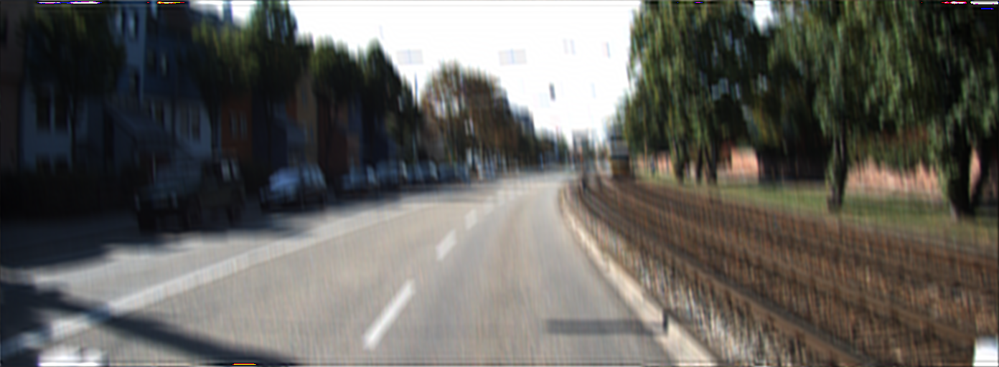

In [56]:
#for angle in range(10,)
temp = remove_motion_blur_w(motion_blur[1],9,73)
cv2_imshow(temp)

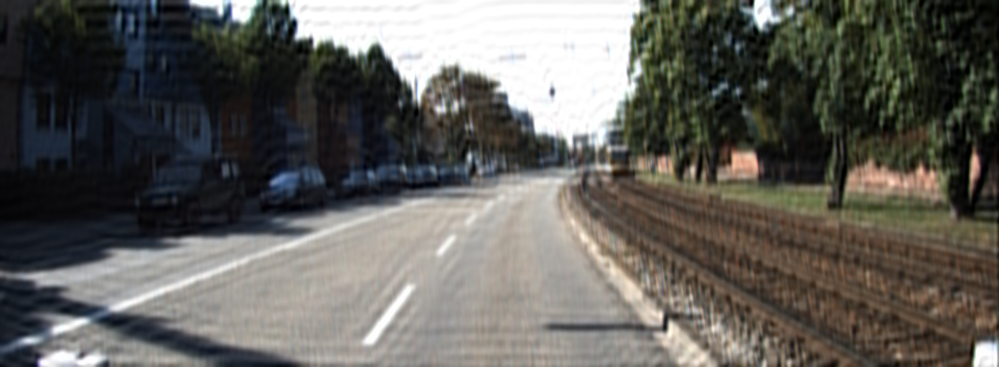

In [63]:
temp = filter_motion_blur(motion_blur[1])
cv2_imshow(temp)

In [58]:
print(skimage.metrics.peak_signal_noise_ratio(input_images[1],temp))
print(skimage.metrics.structural_similarity(input_images[1],temp,multichannel=True))

22.37323278636287


<ipython-input-58-92d05ad27233>:2: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  print(skimage.metrics.structural_similarity(input_images[1],temp,multichannel=True))


0.5875444731496878


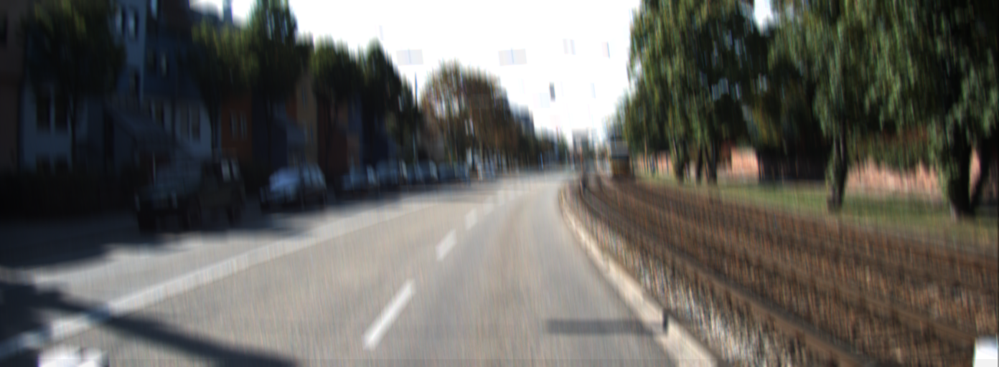

In [ ]:
cv2_imshow(motion_blur[1])

In [ ]:
import cv2
import numpy as np
import skimage.metrics
from itertools import product

def grid_search(blur_img, input_images, angles, kernel_sizes):
    best_snr = -np.inf
    best_str = -np.inf
    best_angle = None
    best_kernel_size = None

    for angle, kernel_size in product(angles, kernel_sizes):
        total_snr = 0
        total_str = 0

        angle = float(angle)
        print(angle, kernel_size)

        for i in range(len(input_images)):
            sharpened = remove_motion_blur_w(blur_img[i], kernel_size, angle)
            snr = skimage.metrics.peak_signal_noise_ratio(input_images[i], sharpened)
            str_ = skimage.metrics.structural_similarity(input_images[i], sharpened, multichannel=True)

            total_snr += snr
            total_str += str_

        average_snr = total_snr / len(input_images)
        average_str = total_str / len(input_images)

        if average_snr > best_snr:
            best_snr = average_snr
            best_str = average_str
            best_angle = angle
            best_kernel_size = kernel_size

    return best_angle, best_kernel_size, best_snr, best_str


In [ ]:
list(range(0, 181, 30))

[0, 30, 60, 90, 120, 150, 180]

In [ ]:
kernel_sizes

[3, 5, 7, 9, 11, 13, 15, 17, 19]

In [ ]:


# Define the range of kernel sizes to search
kernel_sizes = list(range(3, 25,2))  # For example, searching kernel sizes from 3 to 10

# Define the range of angles to search
angles = list(range(-181, 181, 5))  # For example, searching angles from 0 to 180 with a step of 15

best_angle, best_kernel_size, best_snr, best_str = grid_search(motion_blur,input_images, angles, kernel_sizes,)

print("Best Kernel Size:", best_kernel_size)
print("Best Angle:", best_angle)
print("Best PSNR:", best_snr)
print("Best SSIM:", best_str)


-181.0 3


<ipython-input-16-adc15255b110>:22: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  str_ = skimage.metrics.structural_similarity(input_images[i], sharpened, multichannel=True)


-181.0 5
-181.0 7
-181.0 9
-181.0 11
-181.0 13
-181.0 15
-181.0 17
-181.0 19
-181.0 21
-181.0 23
-176.0 3
-176.0 5
-176.0 7
-176.0 9
-176.0 11
-176.0 13
-176.0 15
-176.0 17
-176.0 19
-176.0 21
-176.0 23
-171.0 3
-171.0 5
-171.0 7
-171.0 9
-171.0 11
-171.0 13
-171.0 15
-171.0 17
-171.0 19
-171.0 21
-171.0 23
-166.0 3
-166.0 5
-166.0 7
-166.0 9
-166.0 11
-166.0 13
-166.0 15
-166.0 17
-166.0 19
-166.0 21
-166.0 23
-161.0 3
-161.0 5
-161.0 7
-161.0 9
-161.0 11
-161.0 13
-161.0 15
-161.0 17
-161.0 19
-161.0 21
-161.0 23
-156.0 3
-156.0 5
-156.0 7
-156.0 9
-156.0 11
-156.0 13
-156.0 15
-156.0 17
-156.0 19
-156.0 21
-156.0 23
-151.0 3
-151.0 5
-151.0 7
-151.0 9
-151.0 11
-151.0 13
-151.0 15
-151.0 17
-151.0 19
-151.0 21
-151.0 23
-146.0 3
-146.0 5
-146.0 7
-146.0 9
-146.0 11
-146.0 13
-146.0 15
-146.0 17
-146.0 19
-146.0 21
-146.0 23
-141.0 3
-141.0 5
-141.0 7
-141.0 9
-141.0 11
-141.0 13
-141.0 15
-141.0 17
-141.0 19
-141.0 21
-141.0 23
-136.0 3
-136.0 5
-136.0 7
-136.0 9
-136.0 11
-136.0 13

In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = remove_motion_blur(motion_blur[i],3,75)
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened))
  print(skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

21.55619282375784


<ipython-input-33-5bc34f9707d9>:6: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  print(skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True))


0.5434543841794849


<ipython-input-33-5bc34f9707d9>:8: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True)


20.772079245355826
0.5264827490902586
20.708101440853394
0.5307909139772419
20.250518564436643
0.5259844889961282
20.74989028473752
0.5502633281417056
19.751429851290503
0.5517216517856322
20.034123054844333
0.5196313442416715
19.853794611757344
0.48772809297349246
18.92449236742148
0.4692406381648693
18.753521026347922
0.4565169954254125
18.466022245936827
0.4161106231364114
19.983651410612694
0.5070841100102099


In [ ]:
out = remove_motion_blur(motion_blur[0],,45)
skimage.metrics.peak_signal_noise_ratio(input_images[0],out)

In [ ]:
import cv2
import numpy as np
import skimage.metrics
from itertools import product

def grid_search(input_images, kernel_sizes, angles):
    best_snr = -np.inf
    best_str = -np.inf
    best_kernel_size = None
    best_angle = None

    for kernel_size, angle in product(kernel_sizes, angles):
        total_snr = 0
        total_str = 0

        for image in input_images:
            sharpened = remove_motion_blur(image, kernel_size, angle)
            snr = skimage.metrics.peak_signal_noise_ratio(image, sharpened)
            str_ = skimage.metrics.structural_similarity(image, sharpened, multichannel=True)

            total_snr += snr
            total_str += str_

        average_snr = total_snr / len(input_images)
        average_str = total_str / len(input_images)

        if average_snr > best_snr:
            best_snr = average_snr
            best_str = average_str
            best_kernel_size = kernel_size
            best_angle = angle

    return best_kernel_size, best_angle, best_snr, best_str


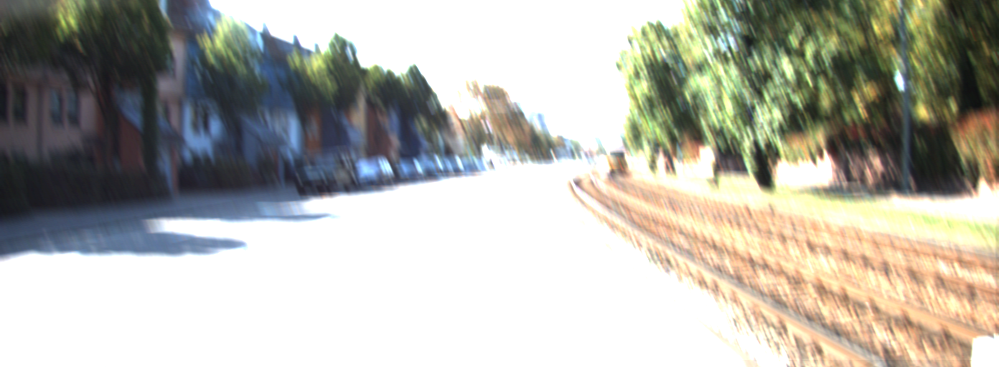

In [ ]:
cv2_imshow(out)

In [ ]:
import numpy as np
from scipy.signal import convolve2d
from scipy.signal import wiener

# Load the blurred image

# Create a Gaussian kernel to simulate the blur
def wiener_test(image):
  kernel_size = 15
  kernel_sigma = 5
  kernel = cv2.getGaussianKernel(kernel_size, kernel_sigma)
  kernel = np.outer(kernel, kernel.transpose())

  # Perform Wiener deconvolution
  estimated_image = wiener(image,)
  return estimated_image



In [ ]:
def remove_gaussian_noise(image):
  '''
  red_channel = image[:,:,0]
  green_channel = image[:,:,1]
  blue_channel = image[:,:,2]
  sharpen_r = filters.median(red_channel)
  sharpen_g = filters.median(green_channel)
  sharpen_b = filters.median(blue_channel)
  sharpen_speck = np.stack([sharpen_r,sharpen_g,sharpen_b], axis = -1)
  '''
  out = filters.median(image)
  d=15
  sigma_color=75
  sigma_space=75
  out = cv2.bilateralFilter(out,d=d, sigmaColor=sigma_color, sigmaSpace=sigma_space)
  return out

In [ ]:
def no_blur(image, d=15, sigma_color=75, sigma_space=75):
    filtered = cv2.bilateralFilter(image, d=d, sigmaColor=sigma_color, sigmaSpace=sigma_space)

    return filtered

In [ ]:
def rgn(image, kernel_size= 5, sigma=1):
    # Convert the image to grayscale
    #gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply the Gaussian filter
    kernel = cv2.getGaussianKernel(kernel_size, sigma)
    kernel_2d = np.outer(kernel, kernel.transpose())
    filtered = cv2.filter2D(image, -1, kernel_2d)

    return filtered

In [ ]:
def remove_speckle_or_gaussian(image, kernel_size=3, sigma_space=50, sigma_color=10):
    """
    Remove speckle noise from an RGB image using an adaptive median filter.

    :param image: input image
    :param kernel_size: size of the median filter kernel
    :param sigma_space: spatial sigma for the bilateral filter
    :param sigma_color: color sigma for the bilateral filter
    :return: image with speckle noise removed
    """
    # Apply bilateral filtering
    filtered = cv2.bilateralFilter(image, kernel_size, sigma_color, sigma_space)

    return filtered

In [ ]:
kernel_size=3
sigma=.3
kernel = cv2.getGaussianKernel(kernel_size, sigma)
kernel_2d = np.outer(kernel, kernel.transpose())
sharpen = cv2.filter2D(gaussian_blur_images[0], -1, kernel_2d)


In [ ]:
sharpen_kernel = np.array([
                           [-1,-1,-1],
                           [-1,9,-1],
                           [-1,-1,-1],
                           ])
sharpen_noise = cv2.filter2D(gaussian_noise_images[0], -1, sharpen_kernel)


In [ ]:
'for gaussian blur'
def sharpen_gaussian_blur(image):
  sharpen_kernel = np.array([
                           [-1,-1,-1],
                           [-1,9,-1],
                           [-1,-1,-1],
                           ])
  #sharpen_kernel = np.array([
  #                      [0,-1,0],
  #                      [-1,5,-1],
  #                      [0,-1,0],
  #                      ])
  #sharpen_kernel = -1*np.ones((5, 5))
  #sharpen_kernel[2,2] = 25
  kernel_size=5
  sigma=.3
  kernel = cv2.getGaussianKernel(kernel_size, sigma)
  kernel_2d = np.outer(kernel, kernel.transpose())
  sharpen_speck = cv2.filter2D(image, -1, kernel_2d)
  #sharpen_speck = cv2.filter2D(image, -1, sharpen_kernel)
  #sharpen_speck = cv2.filter2D(sharpen_speck, -1, sharpen_kernel)

  #blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Apply the sharpening kernel to the blurred image

  #sharpened = cv2.filter2D(blurred, -1, sharpen_kernel)

# Add the sharpened image back to the original image to enhance details
  #sharpen_speck = image + sharpened
  return sharpen_speck


In [ ]:
'for gaussian blur'
def sharpen_gaussian_blur(image):
  sharpen_kernel = np.array([
                           [-1,-1,-1],
                           [-1,9,-1],
                           [-1,-1,-1],
                           ])
  red_channel = image[:,:,0]
  green_channel = image[:,:,1]
  blue_channel = image[:,:,2]
  sharpen_r = cv2.filter2D(red_channel, -1, sharpen_kernel)
  sharpen_g = cv2.filter2D(green_channel, -1, sharpen_kernel)
  sharpen_b = cv2.filter2D(blue_channel, -1, sharpen_kernel)
  sharpen_speck = np.stack([sharpen_r,sharpen_g,sharpen_b], axis = -1)
  #sharpen_speck = cv2.filter2D(image, -1, sharpen_kernel)
  #sharpen_speck = cv2.filter2D(sharpen_speck, -1, sharpen_kernel)
  return sharpen_speck


In [ ]:
'for gaussian blur'
def sharpen_gaussian_blur_grey(image):
  sharpen_kernel = np.array([
                           [-1,-1,-1],
                           [-1,9,-1],
                           [-1,-1,-1],
                           ])
  sharpen_speck = cv2.filter2D(image, -1, sharpen_kernel)
  sharpen_speck = cv2.filter2D(sharpen_speck, -1, sharpen_kernel)
  return sharpen_speck

In [ ]:
gray = cv2.cvtColor(gaussian_blur_images[0], cv2.COLOR_BGR2GRAY)
grey_o= cv2.cvtColor(input_images[0], cv2.COLOR_BGR2GRAY)
out = sharpen_gaussian_blur_grey(gray)
skimage.metrics.peak_signal_noise_ratio(grey_o,out)

18.413043554826032

In [ ]:
def smooth_gaussian_noise(image, kernel_size=9, sigma=0):

    # Apply Gaussian filter to image
    smoothed = cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)
    sharpen_kernel = np.array([
                           [-1,-1,-1],
                           [-1,9,-1],
                           [-1,-1,-1],
                           ])


    smoothed = cv2.filter2D(smoothed, -1, sharpen_kernel)

    return smoothed

In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = smooth_median_noise(gaussian_noise_images[i])
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

20.953779379830255


<ipython-input-42-2fb923c5adf9>:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True)


20.66901031894572
20.660731234892783
20.491358707418822
20.727333846942383
20.28107112475624
20.310664269499647
20.36050442365785
19.86154582461903
19.76694988501717
19.64430322507985
20.33884111278725
0.36164244257885314


In [ ]:
"salt and peppe"
def smooth_median_noise(image, kernel_size=5):
    smoothed = cv2.medianBlur(image,kernel_size)
    '''
    sharpen_kernel = np.array([
                           [-1,-1,-1],
                           [-1,9,-1],
                           [-1,-1,-1],
                           ])
    smoothed = cv2.filter2D(smoothed, -1, sharpen_kernel)
    '''
    return smoothed

In [ ]:
import numpy as np
from scipy.signal import convolve2d
from scipy.signal import wiener

# Load the blurred image

# Create a Gaussian kernel to simulate the blur
def wiener_test(image):
  kernel_size = 15
  kernel_sigma = 5
  kernel = cv2.getGaussianKernel(kernel_size, kernel_sigma)
  kernel = np.outer(kernel, kernel.transpose())

  # Perform Wiener deconvolution
  estimated_image = wiener(image)
  return estimated_image



In [ ]:
def non_local_means(image, h=10, search_window=21, block_size=7):
    # Apply non-local means filter to image
    #filtered = cv2.fastNlMeansDenoisingColored(image, None, h, h, search_window, block_size)
    sharpen_kernel = np.array([[-1,-1,-1,-1,-1],
                           [-1,-1,-1,-1,-1],
                           [-1,-1,25,-1,-1],
                           [-1,-1,-1,-1,-1],
                           [-1,-1,-1,-1,-1]])
    sharpen = cv2.filter2D(image, -1, sharpen_kernel)
    return sharpen

In [ ]:
def unsharp_mask(image, kernel_size=(5, 5), sigma=1.0, amount=1.0, threshold=0):
    """Return a sharpened version of the image, using an unsharp mask."""
    blurred = cv2.GaussianBlur(image, kernel_size, sigma)
    sharpened = float(amount + 1) * image - float(amount) * blurred
    sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
    sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape))
    sharpened = sharpened.round().astype(np.uint8)
    if threshold > 0:
        low_contrast_mask = np.absolute(image - blurred) < threshold
        np.copyto(sharpened, image, where=low_contrast_mask)
    return sharpened

In [ ]:
skimage.metrics.peak_signal_noise_ratio(input_images[0],non_local_means(gaussian_blur_images[0]))

22.450149114429202

In [ ]:
skimage.metrics.peak_signal_noise_ratio(input_images[0],gaussian_blur_images[0])

22.666591735405497

In [ ]:
smoothed = smooth_median_noise(sp_noise[0])

In [ ]:
sm2 = remove_speckle_or_gaussian(sp_noise[0])

In [ ]:
remove_gaussian_blur

# Testing Filters

## Salt and Pepper


In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = remove_SP_noise(sp_noise[i]/255)
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened))
  print(skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

<ipython-input-75-0dc76add04eb>:5: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_r = filters.median(red_channel,selem = np.ones((kernel,kernel)))
<ipython-input-75-0dc76add04eb>:6: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_g = filters.median(green_channel,selem = np.ones((kernel,kernel)))
<ipython-input-75-0dc76add04eb>:7: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_b = filters.median(blue_channel,selem = np.ones((kernel,kernel)))
<ipython-input-83-097aeb7884a2>:6: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  print(skimage.metrics.structural_similarity(input_images[i]/255,sharp

28.074407404218846
0.9228515191203899


<ipython-input-83-097aeb7884a2>:8: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)


27.381937648376766
0.9202563443638708
27.309928049560583
0.9212167660901281
26.943893598930316
0.9227735928869482
27.490205968921767
0.9292310449887059
26.460817217140562
0.9282144678347318
26.62795979848905
0.9246605653564819
26.837071909014174
0.9261469258834737
25.99034543268897
0.9228097999848016
25.76976276448699
0.9203206648497982
25.536819905168016
0.9175153739973531
26.765740881545103
0.9232724604869713


<ipython-input-18-7909a7fd00e7>:6: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_r = filters.median(red_channel,selem = np.ones((kernel,kernel)))
<ipython-input-18-7909a7fd00e7>:7: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_g = filters.median(green_channel,selem = np.ones((kernel,kernel)))
<ipython-input-18-7909a7fd00e7>:8: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_b = filters.median(blue_channel,selem = np.ones((kernel,kernel)))


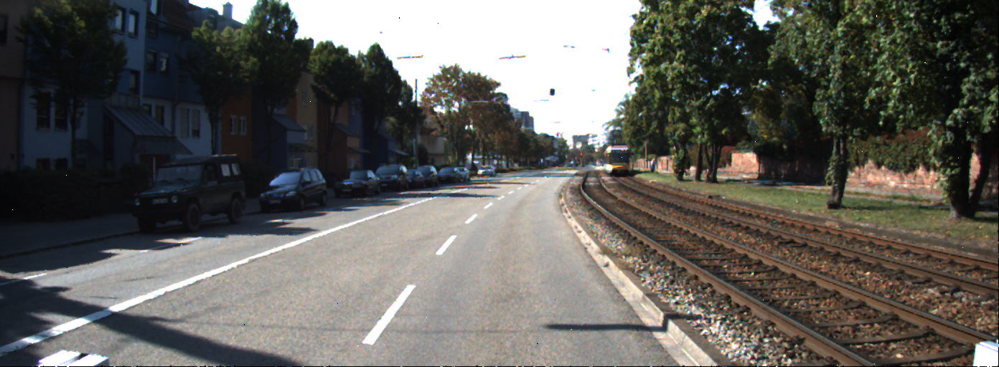

In [ ]:
cv2_imshow(remove_SP_noise(sp_noise[1]))


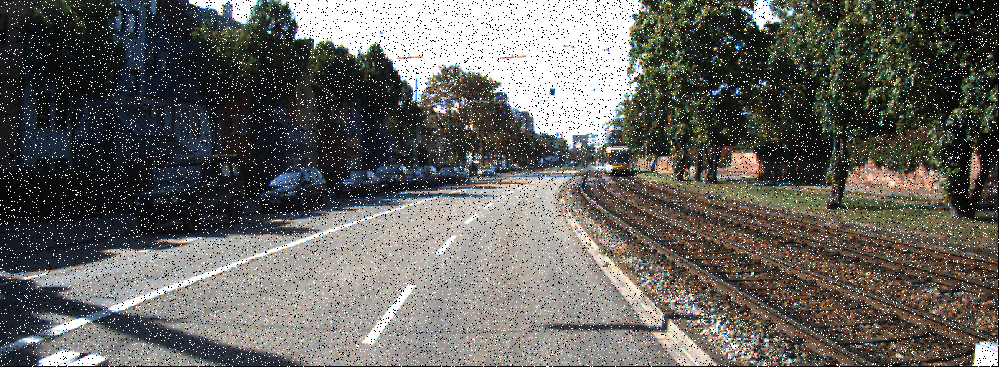

In [ ]:
cv2_imshow(sp_noise[1])


## Speckle


In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = remove_SP_noise(speckle_noise_images[i])
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened))
  print(skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

<ipython-input-21-0dc76add04eb>:5: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_r = filters.median(red_channel,selem = np.ones((kernel,kernel)))
<ipython-input-21-0dc76add04eb>:6: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_g = filters.median(green_channel,selem = np.ones((kernel,kernel)))
<ipython-input-21-0dc76add04eb>:7: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_b = filters.median(blue_channel,selem = np.ones((kernel,kernel)))
<ipython-input-60-4e25813113b1>:6: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  print(skimage.metrics.structural_similarity(input_images[i],sharpened

23.749767905345358
0.6371158260987864


<ipython-input-60-4e25813113b1>:8: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True)


23.408594683784003
0.6477641541268783
23.418867193842342
0.6484641976120097
23.330557454374553
0.6534792240169751
23.68115412110392
0.6463518648225842
23.24811545815466
0.6579319860254774
23.390275018844125
0.6399053381302366
23.6375020147995
0.6724826263312506
22.81734588245606
0.6875374052949853
22.726623345462787
0.6950867872941311
22.73193940547134
0.7020369486244498
23.285522043967152
0.6625596689434331


In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = remove_SP_noise(speckle_noise_images[i]/255)
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened))
  print(skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

<ipython-input-75-0dc76add04eb>:5: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_r = filters.median(red_channel,selem = np.ones((kernel,kernel)))
<ipython-input-75-0dc76add04eb>:6: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_g = filters.median(green_channel,selem = np.ones((kernel,kernel)))
<ipython-input-75-0dc76add04eb>:7: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_b = filters.median(blue_channel,selem = np.ones((kernel,kernel)))


23.749767905345355


<ipython-input-84-9086e65e9075>:6: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  print(skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True))


0.747119803297244


<ipython-input-84-9086e65e9075>:8: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)


23.408594683784003
0.7504990285344721
23.418867193842345
0.7529148428877054
23.330557454374553
0.7591718696321523
23.68115412110392
0.7604505604915955
23.24811545815466
0.7706022825271054
23.390275018844125
0.7586848364126791
23.6375020147995
0.7782270200683746
22.817345882456067
0.7805936445607257
22.726623345462784
0.7871102997628943
22.731939405471344
0.7877596405954157
23.285522043967152
0.766648529888215


<ipython-input-18-7909a7fd00e7>:6: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_r = filters.median(red_channel,selem = np.ones((kernel,kernel)))
<ipython-input-18-7909a7fd00e7>:7: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_g = filters.median(green_channel,selem = np.ones((kernel,kernel)))
<ipython-input-18-7909a7fd00e7>:8: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_b = filters.median(blue_channel,selem = np.ones((kernel,kernel)))


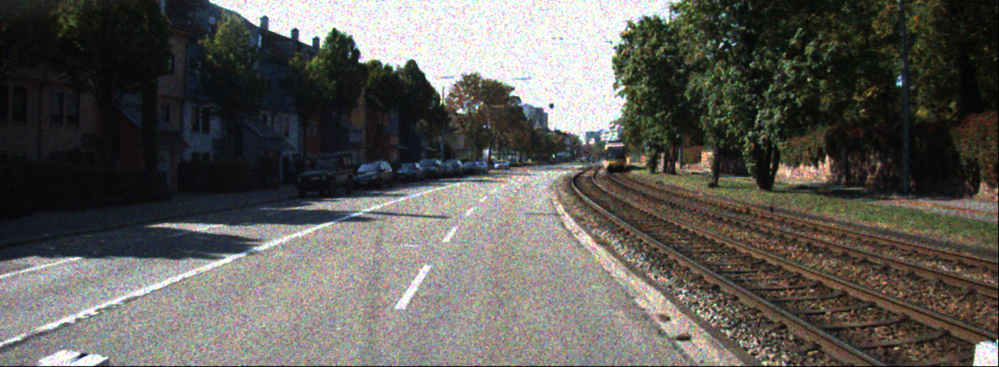

In [ ]:
cv2_imshow(remove_SP_noise(speckle_noise_images[0]))

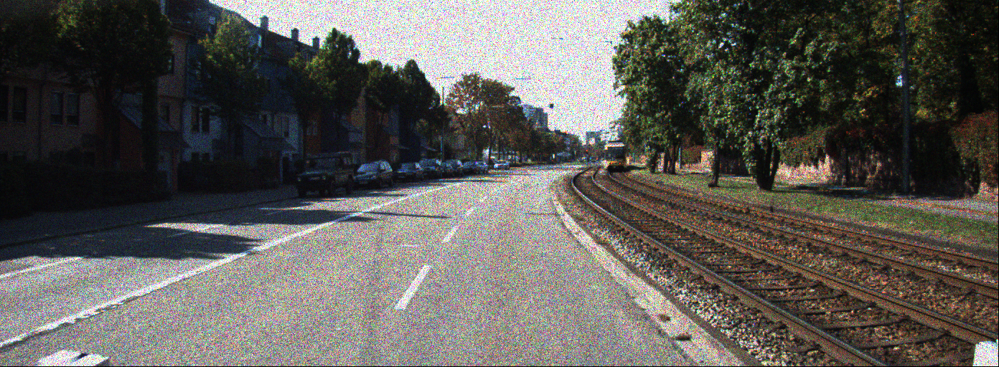

In [ ]:
cv2_imshow(speckle_noise_images[0])

## Gaussian Noise

In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = remove_SP_noise(gaussian_noise_images[i]/255,kernel=9)
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

<ipython-input-75-0dc76add04eb>:5: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_r = filters.median(red_channel,selem = np.ones((kernel,kernel)))
<ipython-input-75-0dc76add04eb>:6: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_g = filters.median(green_channel,selem = np.ones((kernel,kernel)))
<ipython-input-75-0dc76add04eb>:7: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_b = filters.median(blue_channel,selem = np.ones((kernel,kernel)))


21.869084644801426


<ipython-input-81-4de1f86af9ce>:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)


21.302319883518326
21.19375775105582
20.87941293641828
21.27097899842895
20.444525403407724
20.6057727216062
20.650539612012007
19.768100333918653
19.595649474040453
19.372112134612966
20.632023081256435
0.6097597537309719


In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = rgn2(gaussian_noise_images[i]/255)
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

19.864671150072827


<ipython-input-80-5937db51ee4b>:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)


19.774556441102217
19.65974082406888
19.600941879803596
19.725532200597893
19.519580624727386
19.6804674679321
19.679506290349067
19.47463728059769
19.3875667827966
19.396347554093182
19.614868045103766
0.5678240024414292


<ipython-input-18-7909a7fd00e7>:6: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_r = filters.median(red_channel,selem = np.ones((kernel,kernel)))
<ipython-input-18-7909a7fd00e7>:7: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_g = filters.median(green_channel,selem = np.ones((kernel,kernel)))
<ipython-input-18-7909a7fd00e7>:8: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  sharpen_b = filters.median(blue_channel,selem = np.ones((kernel,kernel)))


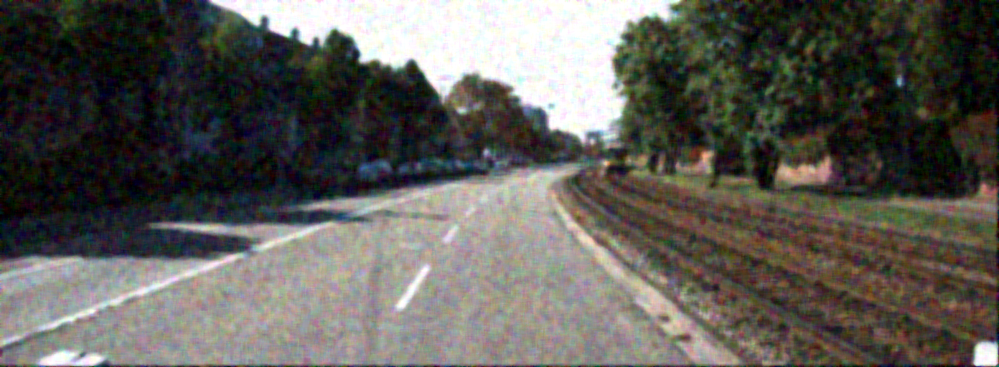

In [ ]:
cv2_imshow(remove_SP_noise(gaussian_noise_images[0],kernel=9))

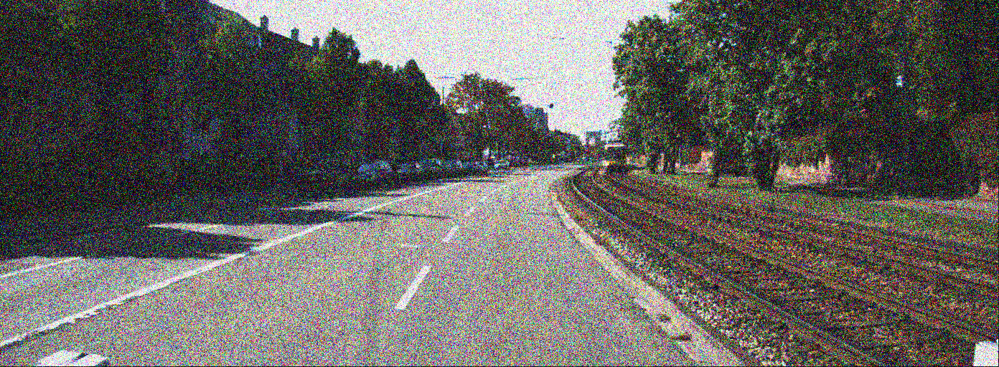

In [ ]:
cv2_imshow(gaussian_noise_images[0])

In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = remove_gaussian_noise(gaussian_noise_images[i],5)
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

14.501389323664203


<ipython-input-61-a9e28a0b1579>:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)


14.460836611193246
14.446702021219659
14.382702918472464
14.392515698357542
14.342973349417768
14.258190250582494
14.332630165965949
14.23012447555372
14.213224108714497
14.123565229930763
14.33498674118839
0.2942718152698969


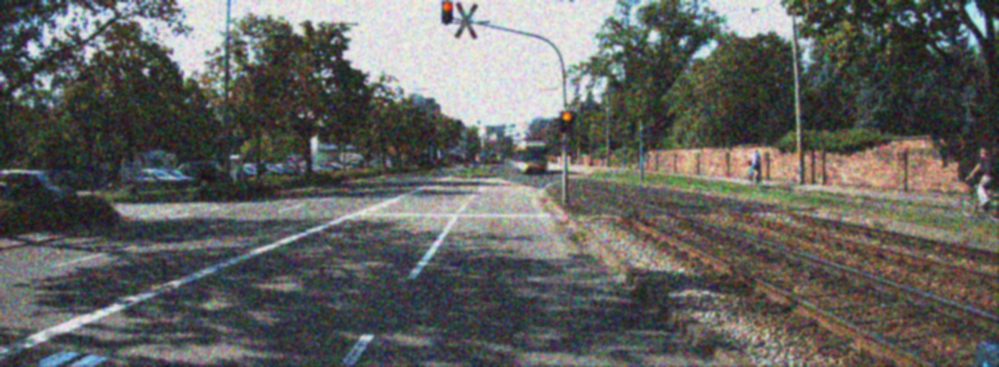

In [ ]:
cv2_imshow(sharpened)

## Gaussian Blur

In [ ]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = remove_gaussian_blur(gaussian_blur_images[i]/255,5)
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i]/255,sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

23.48559191338768


<ipython-input-43-62bb50e6cd8e>:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i]/255,sharpened,multichannel=True)


22.866926771389995
22.74066918885802
22.38837709536036
22.766323780661033
21.819484339940697
22.039918345967227
22.092601332208417
21.16976920049168
20.94488471663203
20.768277513799617
22.098438563517888
0.7482697879651087


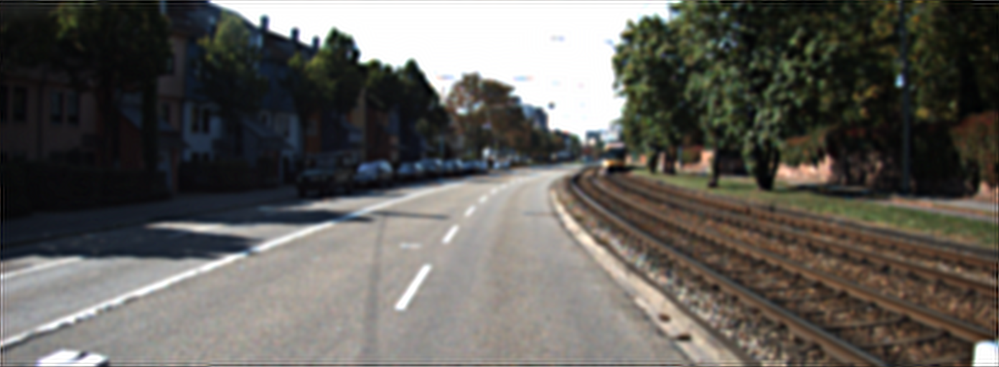

In [ ]:
cv2_imshow(255*remove_gaussian_blur(gaussian_blur_images[0]/255,5))

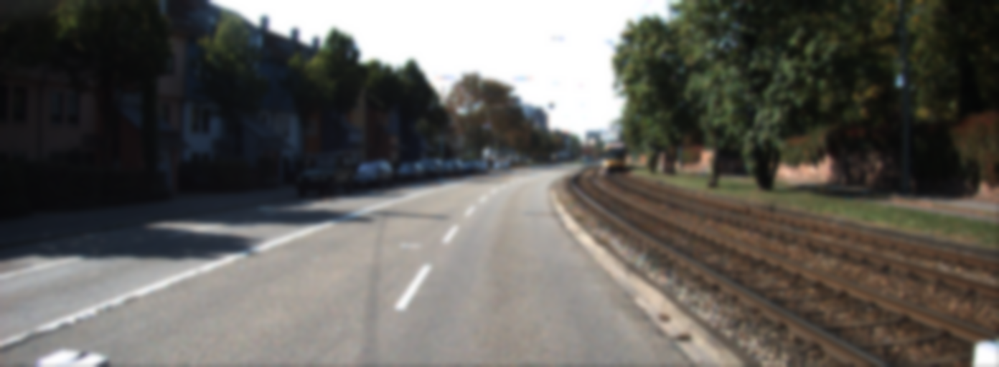

In [ ]:
cv2_imshow(gaussian_blur_images[0])

## Motion Blur

In [64]:
total_snr =0
total_str = 0
for i in range(len(input_images)):
  sharpened = remove_motion_blur(motion_blur[i])
  print(skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened))
  total_snr += skimage.metrics.peak_signal_noise_ratio(input_images[i],sharpened)
  total_str += skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True)
print(total_snr/len(input_images))
print(total_str/len(input_images))

22.82994065471076


<ipython-input-64-329c48300742>:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  total_str += skimage.metrics.structural_similarity(input_images[i],sharpened,multichannel=True)


22.37323278636287
19.183184458973834
17.94627586985172
22.624906070823524
20.675192131059497
20.46992434766867
21.75224647246882
19.990000820874805
18.337100333311753
19.415762629801
20.508887870537023
0.5080701627421849


In [ ]:
def deblur_image(img, kernel_size, snr):
    # Create a Gaussian blur kernel
    kernel = cv2.getGaussianKernel(kernel_size, 0)
    kernel = np.outer(kernel, kernel.transpose())

    # Split the input image into color channels
    b, g, r = cv2.split(img)

    # Apply the Gaussian blur to each color channel
    blurred_b = cv2.filter2D(b, -1, kernel)
    blurred_g = cv2.filter2D(g, -1, kernel)
    blurred_r = cv2.filter2D(r, -1, kernel)

    # Compute the power spectrum of the blurred image
    f_b = np.fft.fft2(blurred_b)
    f_g = np.fft.fft2(blurred_g)
    f_r = np.fft.fft2(blurred_r)
    fshift_b = np.fft.fftshift(f_b)
    fshift_g = np.fft.fftshift(f_g)
    fshift_r = np.fft.fftshift(f_r)
    psd_b = np.abs(fshift_b) ** 2
    psd_g = np.abs(fshift_g) ** 2
    psd_r = np.abs(fshift_r) ** 2

    # Compute the Wiener filter
    eps = snr ** 2
    k_b = psd_b / (psd_b + eps)
    k_g = psd_g / (psd_g + eps)
    k_r = psd_r / (psd_r + eps)

    # Apply the Wiener filter to each color channel
    deblurred_b = np.fft.ifft2(np.fft.ifftshift(k_b * fshift_b))
    deblurred_g = np.fft.ifft2(np.fft.ifftshift(k_g * fshift_g))
    deblurred_r = np.fft.ifft2(np.fft.ifftshift(k_r * fshift_r))
    deblurred_b = np.abs(deblurred_b)
    deblurred_g = np.abs(deblurred_g)
    deblurred_r = np.abs(deblurred_r)
    deblurred_b = cv2.normalize(deblurred_b, None, 0, 255, cv2.NORM_MINMAX)
    deblurred_g = cv2.normalize(deblurred_g, None, 0, 255, cv2.NORM_MINMAX)
    deblurred_r = cv2.normalize(deblurred_r, None, 0, 255, cv2.NORM_MINMAX)
    deblurred_b = deblurred_b.astype(np.uint8)
    deblurred_g = deblurred_g.astype(np.uint8)
    deblurred_r = deblurred_r.astype(np.uint8)

    # Merge the deblurred color channels into a single color image
    deblurred = cv2.merge((deblurred_b, deblurred_g, deblurred_r))

    return deblurred

In [ ]:
#sharpen_noise = smooth_gaussian_noise(gaussian_blur_images[0])
sharpen_noise = rgn(gaussian_blur_images[0],kernel_size=9,sigma = .5)

In [ ]:
sharpen_kernel = np.array([[-1,-1,-1,-1,-1],
                           [-1,-1,-1,-1,-1],
                           [-1,-1,25,-1,-1],
                           [-1,-1,-1,-1,-1],
                           [-1,-1,-1,-1,-1]])
sharpen = cv2.filter2D(gaussian_blur_images[0], -1, sharpen_kernel)
skimage.metrics.peak_signal_noise_ratio(input_images[0],sharpen)

22.450149114429202

In [ ]:
def bilat_filt(image, d=15, sigma_color=75, sigma_space=75):

    # Split the image into individual color channels
    b, g, r = cv2.split(image)

    # Apply the bilateral filter to each color channel separately
    b_filtered = cv2.bilateralFilter(b, d=d, sigmaColor=sigma_color, sigmaSpace=sigma_space)
    g_filtered = cv2.bilateralFilter(g, d=d, sigmaColor=sigma_color, sigmaSpace=sigma_space)
    r_filtered = cv2.bilateralFilter(r, d=d, sigmaColor=sigma_color, sigmaSpace=sigma_space)

    # Merge the filtered color channels back into an RGB image
    filtered = cv2.merge((b_filtered, g_filtered, r_filtered))

    return filtered